# ARM Equity Analysis & Industry Research

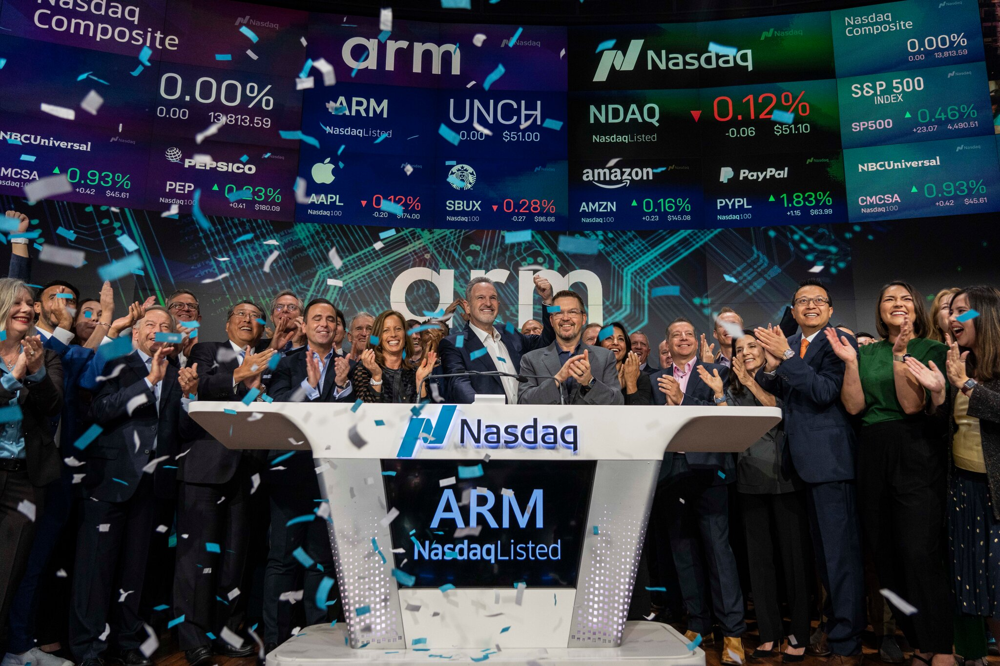

## Background about me
Hey! My name is Rudra Pandya! I am a rising sophomore at Rutgers University majoring in Finance with a minor in Mathematics at Rutgers Business School. Formerly on the Computer Science track, I plan to use the fusion of sciences and business to create effective projects and cases. In this instance, I implemented Yfinance (Yahoo Finance) API to perform this project.

## What is ARM?
Founded over 30 years ago with a focus on designing power-efficient CPUs for battery-operated devices, Arm has become a pivotal figure in CPU technology. There are many advantageous points about this company. 
- **Energy-Efficient Compute Platforms:** Renowned for its energy-efficient compute platforms, Arm drives the most power-efficient performance globally, enabling advanced, AI-capable, visually immersive, and autonomous experiences across devices from sensors to smartphones, automobiles, and data centers.

- **High-Performance IP Solutions:** Arm develops and licenses high-performance, low-cost, and energy-efficient IP solutions for CPUs, GPUs, NPUs, and interconnect technologies, which are crucial to many leading semiconductor companies and OEMs.

- **Custom Chip Design:** By licensing instruction sets for custom chip designs, Arm provides partners with flexible, trusted computing platforms that balance common software standards with customizable hardware.

- **Fostering Innovation:** Arm's solutions foster innovation and differentiation in partners' products, enabling them to bring innovative, specialized processing to market.

## Project description
This project delves into comparative company analysis and ARM's Equity (Stock) Analysis. After analyzing each company, we look for similarities in data and relate it to real world market events since ARM's IPO date to highlight cause of companies' (including ARM) performances. In addition, the project also goes over regression model to represent ARM's data and uncovers the financial statements which relate to its performance.


- **Market Capitalization:** Visualizes the market share of semiconductor companies using a pie chart.

- **Closing Price vs Time:** Displays the stock prices of semiconductor companies over time in a line chart.

- **Highest Profit vs Time:** Shows the daily profit (high - low prices) of semiconductor companies over time in a line chart.

- **Financial Metrics Analysis:** Displays financial metrics of Nvidia and ARM and potential reasons for their numbers. 

- **Investment Recommendation:** Providing a well-thought recommendation on the buying opportunity for ARM stock. 


## Prerequisites & API guide
This project is constructed using `yfinance` API. It is basically the Yahoo Finance API used by programmers to dive deep into the markets. 
In order to install yfinance, please run this on your terminal: 
```bash 
pip install yfinance
```
After this, yfinance is in your computer and you can freely use this with Python in Jupyter Notebook. Before that, let's go over the basic guide of how yfinance works and how to retrieve information about
your favorite company (or commodity). In this instance, I will use Apple Stock denoted by 'AAPL' in ticker. 

```python
# Creating a ticker object
apple = yf.Ticker("AAPL")

# Storing and printing basic information
info = apple.info
print("Basic Info: ", info)

# Get historical market data from past month
history = apple.history(period = '1mo')
print("Historical Data (1 month): ")
print(hist)

# Get the current stock price
curr = apple.history(period = '1mo')['Close'].iloc[-1] # -1 denotes last entry of price and filtered to closing price

# Get the dividends
dividends = apple.dividends
print("Dividends: ")
print(dividends)

# Get the stock splits
splits = apple.splits
print("Stock Splits: ")
print(splits)
```

This is what the output looks like below of Apple's history in a one month period

In [1]:
import yfinance as yf
from IPython.display import display

apple = yf.Ticker('AAPL')
history = apple.history(period='1mo')
display(history)

,Open,High,Low,Close,Volume,Dividends,Stock Splits
Date,,,,,,,
2024-05-03 00:00:00-04:00,186.397167,186.746699,182.412581,183.131607,163224100,0.00,0.0
2024-05-06 00:00:00-04:00,182.103015,183.950500,180.175621,181.463882,78569700,0.00,0.0
2024-05-07 00:00:00-04:00,183.201504,184.649537,181.074400,182.152924,77305800,0.00,0.0
2024-05-08 00:00:00-04:00,182.602329,182.822032,181.204216,182.492477,45057100,0.00,0.0
2024-05-09 00:00:00-04:00,182.312720,184.409882,181.863333,184.320007,48983000,0.00,0.0
2024-05-10 00:00:00-04:00,184.899994,185.089996,182.130005,183.050003,50759500,0.25,0.0
2024-05-13 00:00:00-04:00,185.440002,187.100006,184.619995,186.279999,72044800,0.00,0.0
2024-05-14 00:00:00-04:00,187.509995,188.300003,186.289993,187.429993,52393600,0.00,0.0
2024-05-15 00:00:00-04:00,187.910004,190.649994,187.369995,189.720001,70400000,0.00,0.0


## Project Overview 

### Important: run the below cell before running any code blocks

From here on out, the project begins. The necessary imports are needed so that literally all of the code blocks can run as intended. This would serve as the brain of the project, you would have to run this as you open the notebook to run other code blocks. There are comments which concisely describe what each imports' functions are (no pun intended). 

In [1]:
# The necessary imports
import yfinance as yf   #imports yfinance to load the data
import numpy as np      #imports numpy for matrix calculations 
import pandas as pd     #imports pandas for data frame (rows, cols representation) - rarely used
import matplotlib.pyplot as plt #imports matplotlib for graphing data
from datetime import datetime   #imports datetime for using/manipulating dates
from ipywidgets import interact, IntSlider, DatePicker  #imports widgets to have an interactive toggler
from IPython.display import display #imports display to show data in organized way
import random   #imports random for different color of line charts

### ARM Ticker 
As discussed earlier in Yfinance terminology, we are going to use ARM as a ticker and this will serve as a benchmark for other code blocks as well. 
The type of .info is a dictionary. That being said, it would be suited for the output to be in key, value pairs to make it look organized for you to read and follow through. The information, would literally, have anything you could think of such as headquarter address, zip code, phone number, and more. Here is the output below to highlight information about ARM company. **Please run this before running the next code block.**

In [2]:
arm_ticker = yf.Ticker('ARM')
arm_info = arm_ticker.info
for key,val in arm_info.items():
   print(key, ":", val)

address1 : 110 Fulbourn Road
city : Cambridge
zip : CB1 9NJ
country : United Kingdom
phone : 44 1223 400 400
website : https://www.arm.com
industry : Semiconductors
industryKey : semiconductors
industryDisp : Semiconductors
sector : Technology
sectorKey : technology
sectorDisp : Technology
longBusinessSummary : Arm Holdings plc architects, develops, and licenses central processing unit products and related technologies for semiconductor companies and original equipment manufacturers rely on to develop products. The company is involved in the licensing, marketing, research, and development of microprocessors, systems intellectual property (IPs), graphics processing units, physical IP and associated systems IPs, software, tools, and other related services. It also offers system IP products, including memory controller IP, interconnect IP, and other on-chip peripheral components; and compute platforms for a range of devices and applications. The company's products are used in various mark

### Data about prices
As we have initialized the contructor by the " arm_ticker " variable in the previous code block, we can use any getter methods to retrieve information. In this instance, we can use .history which shows data about ARM's opening price, highest price, lowest price, closing price, volume, dividends, and stock splits at particular dates. In most of the data available in Kaggle (which is manually inputted), there happens to be adjusted-closing price. Let's go over the definitions of each terms I have mentioned
- **Opening Price:** Price of the stock when the market opens at 9:30 AM (EST, NYC time)
- **Highest Price:** Highest price the stock has ever reached at that particular date
- **Lowest Price:** Lowest price the stock has ever reached at that particular date
- **Closing Price:** Closing price of the stock when the market closes at 4:00 PM (EST, NYC time)
- **Volume:** The amount of shares bought or sold at that particular date
- **Dividends:** A portion of money paid to shareholders from company's earnings
- **Stock Split:** For example, a 10 for 1 stock split is where existing shareholders' shares are multiplied by 10 and the price of the stock is reduced to divided by 10.
 
Not present, but still helpful to know
- **Adjusted-closing price:** Accounts for changes in closing price after stock split or dividend decisions. 

However, after doing some research on the `yfinance` API, the closing price which you see below already accounts for changes relative to executive decisions such as stock splits. Here is what the data looks like of ARM's stock data since its IPO to the current date. Keep in mind, if the day is still ongoing, the data will not include the day's data until the market closes.


In [3]:
hist = arm_ticker.history(start = "2023-09-14", end = datetime.today().strftime('%Y-%m-%d'))
display(hist)   #using display to show data in organized manner
print(hist['Close'][0]) #first (earliest) price of type closing
print(hist['Close'][-1]) #last (latest) price of type closing

,Open,High,Low,Close,Volume,Dividends,Stock Splits
Date,,,,,,,
2023-09-14 00:00:00-04:00,56.099998,66.279999,55.540001,63.590000,130534500,0.0,0.0
2023-09-15 00:00:00-04:00,68.629997,69.000000,60.750000,60.750000,74568900,0.0,0.0
2023-09-18 00:00:00-04:00,57.950001,58.741001,55.020000,58.000000,34571900,0.0,0.0
2023-09-19 00:00:00-04:00,56.250000,56.779999,53.880001,55.169998,18308600,0.0,0.0
2023-09-20 00:00:00-04:00,55.169998,55.400002,51.520000,52.910000,16369500,0.0,0.0
...,...,...,...,...,...,...,...
2024-05-31 00:00:00-04:00,119.919998,123.879997,116.010002,120.519997,9110400,0.0,0.0
2024-06-03 00:00:00-04:00,125.000000,129.850006,122.540001,127.120003,11447900,0.0,0.0
2024-06-04 00:00:00-04:00,126.875000,127.669998,122.889999,125.860001,6879800,0.0,0.0


63.59000015258789
137.125


### Insights from ARMs first opening day (IPO)

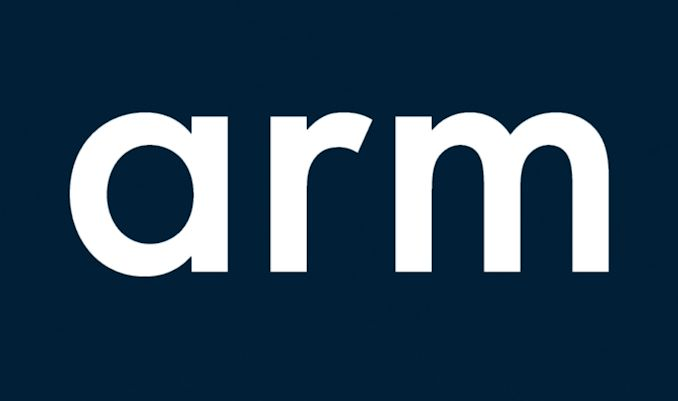

- **Impressive Market Debut:** British chipmaker ARM had a notable IPO on the Nasdaq, with shares opening at 56.10 dollars, quickly jumping over 20% to above 61 dollars, and closing up nearly 25% from the initial 51 dollars per share price, raising Arm's market cap above 60 billion dollars from an initial 54.5 dollar billion valuation. It would make sense because 130 million worth of trades took place just for ARM alone during the IPO date, potentially indicating strong uprise in price. 

- **Significance for IPO Market:** ARM's IPO is the most high-profile since 2021 and marks a potential revival in the tech IPO market, which has seen a significant slowdown. Experts suggest that Arm's successful debut could pave the way for more tech companies to go public, signaling a shift in the IPO landscape. The significant volume followed by increase in price shows how blue-chip technology stocks moving in the pace of AI boom could boost investor confidence. 

[Reference #1](https://finance.yahoo.com/news/arm-stock-surges-24-over-ipo-price-after-nasdaq-debut-162614427.html)

### Market Capitalization
This is where we will begin with comparative analysis where we analyze what the Semiconductor Industry looks like with each company's worth. To calculate market capitalization, simply multiply the closing price of the stock with the number of outstanding shares. There are plenty of companies in the semiconductor industry, but here we will rely on the companies listed by [investopedia](https://www.investopedia.com/articles/markets/012216/worlds-top-10-semiconductor-companies-tsmintc.asp).
Here are the tickers:
- **AMAT:** Applied Materials Inc
- **AMD:** Advanced Micro Devices
- **ASML:** Advanced Semiconductor Materials International
- **ASX:** ASE Technology Holdings Co
- **AVGO:** Broadcom Inc
- **INTC:** Intel
- **MU:** Micron Technology Inc
- **NVDA:** Nvidia (the big boy)
- **QCOM:** Qualcomm Inc
- **TSM:** Taiwan Semiconductor Manufacturing Co
- **ARM:** ARM Holdings

Now back to Market Capitalization, what we will do is multiply each of the Stock's closing price by the number of outstanding shares. We will represent the findings in a Pie chart, using matplotlib, to roughly know the market cap of each company. In the end, we will derive insights by relating real-world market events to prove the current market capitalization.

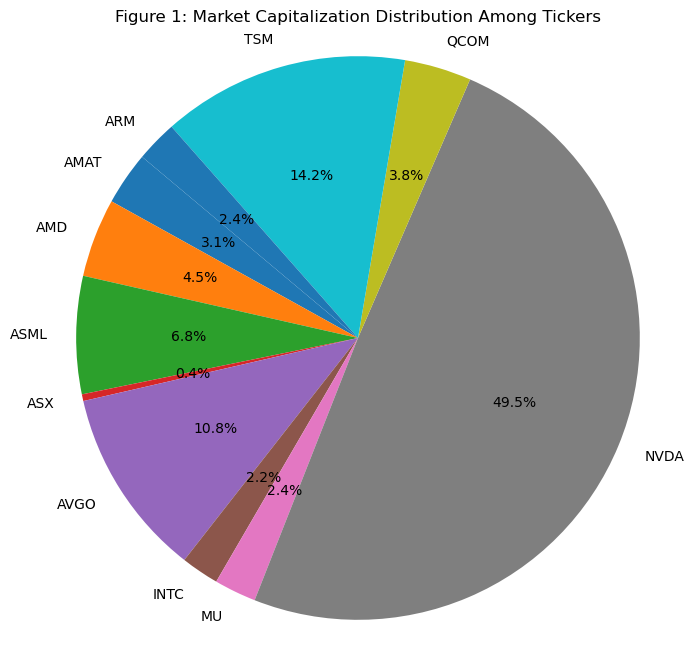

NVDA latest closing price: 1208.8800048828125 with outstanding shares of 2459830016 at date 2024-06-07
ARM latest closing price: 136.57000732421875 with outstanding shares of 1047840000 at date 2024-06-07


In [9]:
# List of tickers
tickers = ['AMAT', 'AMD', 'ASML', 'ASX', 'AVGO', 'INTC', 'MU', 'NVDA', 'QCOM', 'TSM', 'ARM']

# Dictionary to store the data
data = {}

# ARM v Nvda
nvda_ticker_1 = yf.Ticker('NVDA')
arm_ticker_1 = yf.Ticker('ARM')

# Define the date range
start_date = "2023-09-14"
end_date = datetime.today().strftime('%Y-%m-%d')

# Fetch historical data for each ticker and store it in the data dictionary
for ticker in tickers:
    data[ticker] = yf.Ticker(ticker).history(start=start_date, end=end_date)

# Calculate the market capitalization for each ticker
market_capitalizations = {}
for ticker, ticker_data in data.items():
    outstanding_shares = yf.Ticker(ticker).info.get('sharesOutstanding')
    if outstanding_shares:  # Checks if there are outstanding shares aka outstanding_shares != null
        market_capitalizations[ticker] = ticker_data['Close'][-1] * outstanding_shares      #Calculates market cap and stores it in dictionary of each ticker

# Pie chart
plt.figure(figsize=(8, 8))
plt.pie(market_capitalizations.values(), labels=market_capitalizations.keys(), autopct='%1.1f%%', startangle=140)
plt.title('Figure 1: Market Capitalization Distribution Among Tickers')
plt.axis('equal')
plt.show()

# NVDA latest closing price and outstanding shares
nvda_close_price = nvda_ticker_1.history(start=start_date, end=end_date).iloc[-1]['Close']
nvda_outstanding_shares = nvda_ticker_1.info.get('sharesOutstanding')
nvda_date = nvda_ticker_1.history(start=start_date, end=end_date).index[-1].strftime('%Y-%m-%d')

# ARM latest closing price and outstanding shares
arm_close_price = arm_ticker_1.history(start=start_date, end=end_date).iloc[-1]['Close']
arm_outstanding_shares = arm_ticker_1.info.get('sharesOutstanding')
arm_date = arm_ticker_1.history(start=start_date, end=end_date).index[-1].strftime('%Y-%m-%d')

print(f"NVDA latest closing price: {nvda_close_price} with outstanding shares of {nvda_outstanding_shares} at date {nvda_date}")
print(f"ARM latest closing price: {arm_close_price} with outstanding shares of {arm_outstanding_shares} at date {arm_date}")


### How market capitalization flunctuates?

Market Capitalization = number of outstanding shares x latest closing price

If either the number of outstanding shares or the closing price increases due to market demand, market capitalization will proportionally also increase.

### Why is the Nvidia stock a big player in the market (pre-split)?

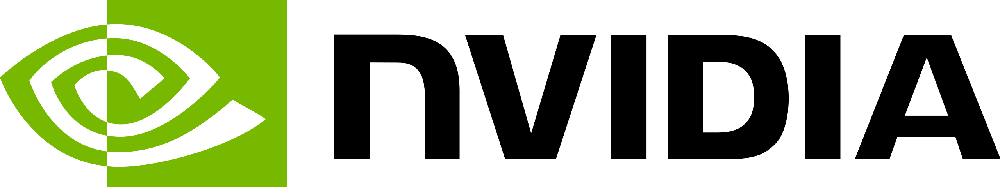

Background: Nvidia is the second most valuable company in the world and a demanding stock of the market.

- **Financial Results:** Nvidia recently reported impressive financial results. According to its financial information, over the Q1 FY25, it has earned 26,000 millions of dollars in revenue, about 4000 millions of dollar more than Q4 FY24. This robust performance provides investors confidence in future prospects of the company - increasing the share price and the market capitalization. 
- **AI Boom:** Nvidia is a leader of the AI revolution. The company's advanced AI-driven chips such as Blackwell and Rubin are driving substantial growth for the company. Research and Development produces an incentive for the investors to help with the funding aspects of the company, which brings lucrativeness. 
- **Partnerships:** Colloborations with pivotal figures such as Elon Musk's AI start-up xAI and Foxconn's advanced computing center in Taiwan boosts the company's growth prospects and market credibility.
- **Stock Split:** Nvidia's upcoming 10-for-1 stock split has generated investor interest to purchase the shares so they can benefit by earning multiple shares post split. This incentive may have boosted the price of the stock. 

[Reference #1](https://finance.yahoo.com/news/etfs-tap-nvidias-10-1-140000914.html)

[Reference #2](https://nvidianews.nvidia.com/news/nvidia-announces-financial-results-for-first-quarter-fiscal-2025)

### What makes Broadcom a worthy competitor of Nvidia?

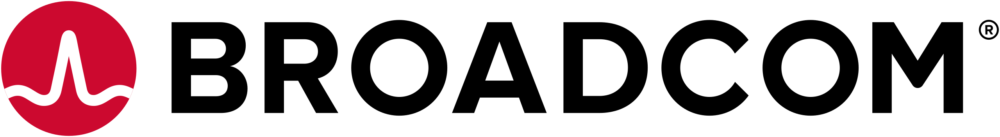

Background: Broadcom is another stock like Nvidia whose market price is above its competitors.

- **AI application:** Boradcom designs application-specified integrated circuits (ASICs) tailored to solve specific tasks. This makes it powerful than general-purpose parallel computing AI-powered chips of Nvidia. Research and Development in these chips produce a good rival for Nvidia which people could also invest in to diversify their interests.  
- **Earnings growth:** Morgan Stanley forecasts an 85% annual increase in revenue until 2027 potentially generating 30 billion dollars of revenue. Additionally, analysts predict Broadcom's earnings to grow at an annual rate of 15% over the next five years. Along with Nvidia's financial performance, Broadcom's forecasted revenue potentially due to its research and development in AI chips shows the company's interests in the demanded semiconductor market. 
- **Acquisition Synergies:** The successful acquisition of VMware is expected to benefit Broadcom, particularly in integrating and capitalizing on AI-related technologies and revenues. Investors are deeply captivated by acquisition interests and the usage of the company thereafter, making Broadcom a potentially worthwhile of a company. 

[Reference #1](https://finance.yahoo.com/news/broadcom-inc-avgo-top-ai-135404734.html)

[Reference #2](https://finance.yahoo.com/news/2-artificial-intelligence-ai-stocks-120700288.html)

### What function does ARM and its business model serve in semiconductor market?

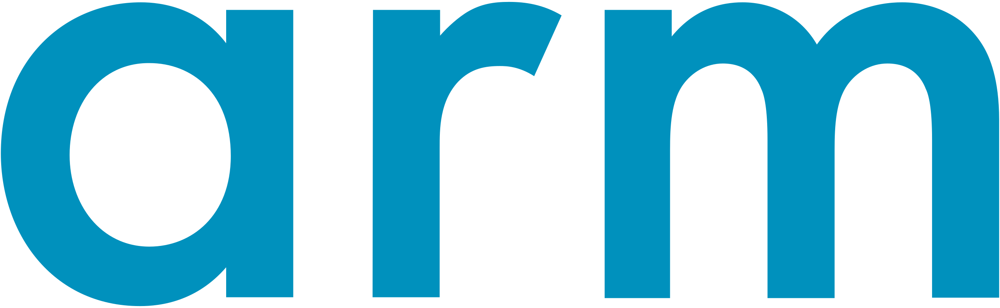

Background: ARM is a brand new IPO of 2023 making it an underdog of the semiconductor market.

- **Architecture and Design Licensing:** Arm Holdings functions by licensing its semiconductor architecture and chip designs to other companies, such as Nvidia and Apple. This approach allows Arm to generate revenue from initial licensing fees and ongoing royalties without directly manufacturing and selling the chips.

- **Facilitating AI Integration:** Arm's designs are crucial for the development and deployment of AI technologies. The company is experiencing a surge in license revenue driven by AI demand, which indicates its designs are integral to AI applications in various products, promising future growth in royalty income as these designs are implemented and sold.

- **Power-Efficient CPU Solutions:** Arm's strength lies in its power-efficient CPU architecture, which is highly valued in AI data centers and other power-sensitive applications. This efficiency provides a competitive edge, making Arm’s designs a preferred choice for companies looking to optimize performance and energy use in AI-driven environments.

[Reference #1](https://www.nasdaq.com/articles/is-artificial-intelligence-ai-stock-arm-holdings-a-buy-right-now-3-things-you-need-to-know)

### Closing Prices vs Time graphs
In here, we analyze the closing prices vs time of each company in the Semiconductor Industry. The closing price, as discussed, already accounts for stock splits and/or dividend decisions so it is readily adjusted. In addition, we are going to be analyzing companies' performancies ever since ARM's IPO date, that being, 2023-09-14 to the current date which is available using datetime import. In the end, we will derive insights of the causation of this performance, if or not similar, of different companies.


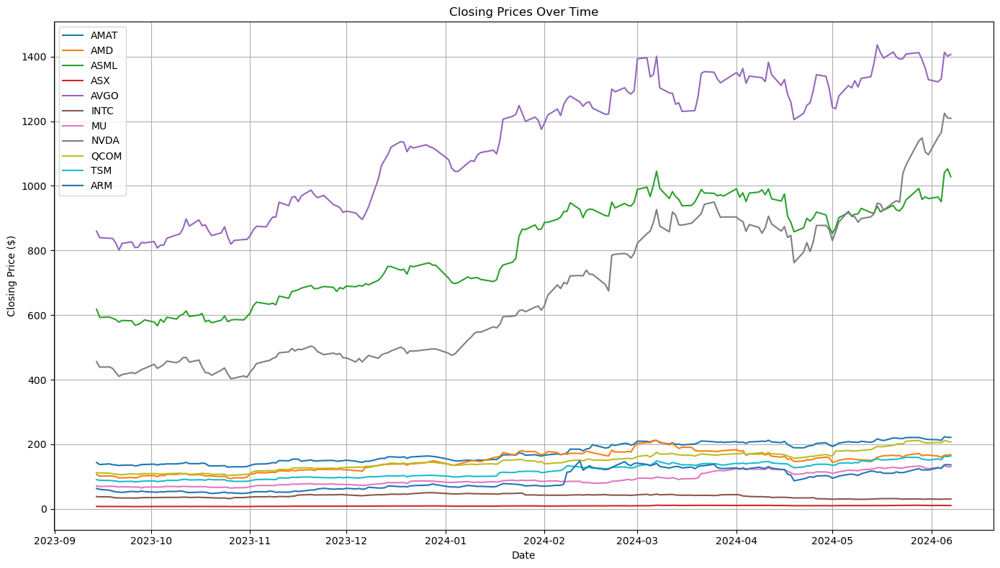

In [6]:

# List of tickers
tickers = ['AMAT', 'AMD', 'ASML', 'ASX', 'AVGO', 'INTC', 'MU', 'NVDA', 'QCOM', 'TSM', 'ARM']
# Dictionary to store the data
data = {}

# Define the date range
start_date = "2023-09-14"
end_date = datetime.today().strftime('%Y-%m-%d')

# Fetch historical data for each ticker and store it in the data dictionary
for ticker in tickers:
    data[ticker] = yf.Ticker(ticker).history(start=start_date, end=end_date)
plt.figure(figsize=(14, 8))
for ticker in data:
    plt.plot(data[ticker].index, data[ticker]['Close'], label=ticker)
plt.title('Closing Prices Over Time')
plt.xlabel('Date')
plt.ylabel('Closing Price ($)')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

### Closing Price vs Time graphs (Part 2)

The graph above looks distinct for big companies such as ASML, AVGO, and NVDA. It looks congested for stocks which are performing in the range of 200 dollars or below. In order to see distinct performances of all the listed companies, it would be suited to graph them individually as functioned by the code below. 

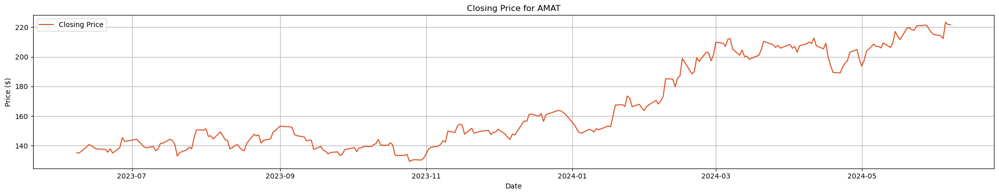

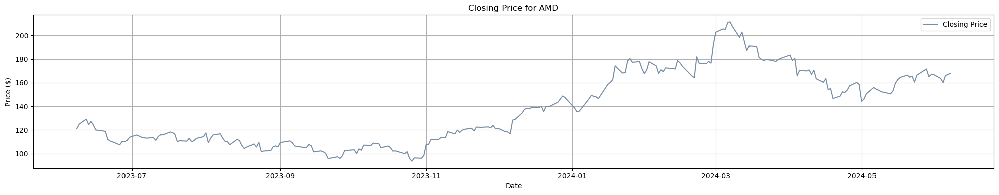

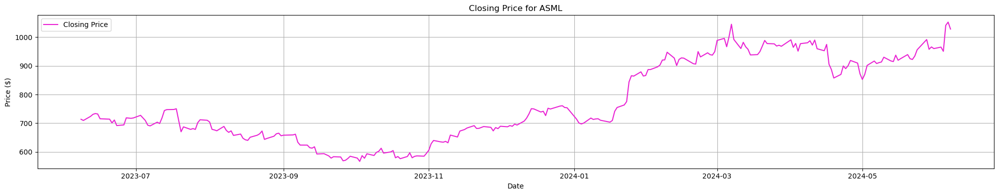

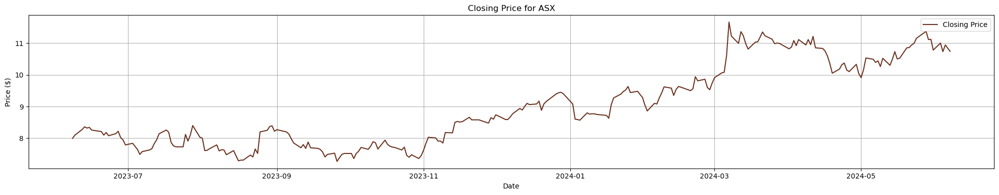

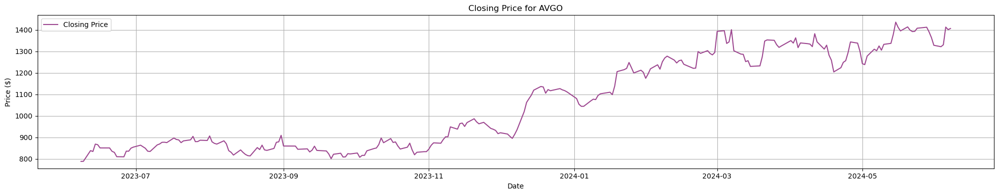

...

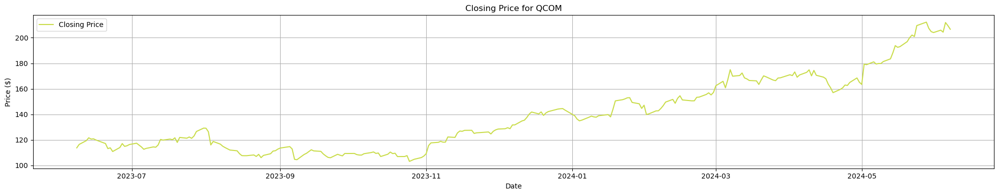

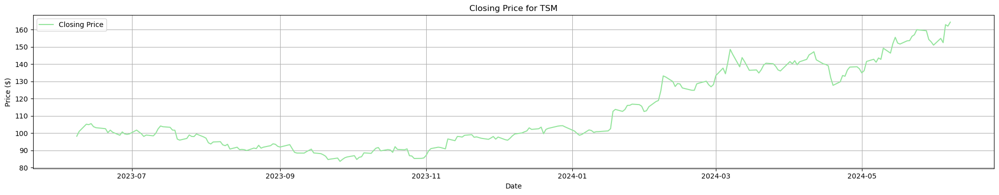

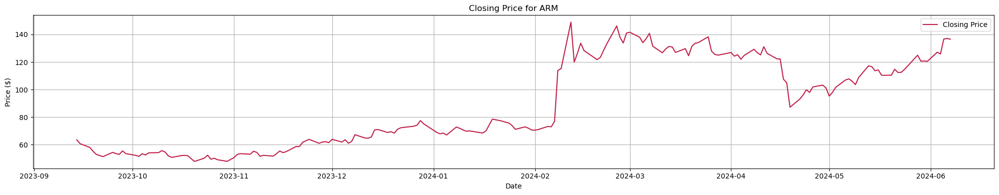

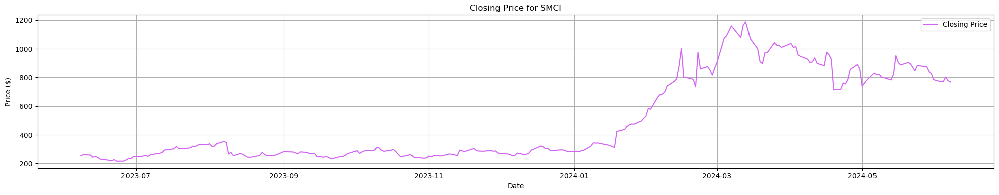

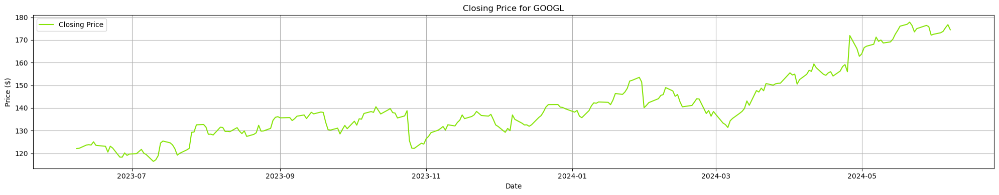

In [8]:
# List of tickers
tickers = ['AMAT', 'AMD', 'ASML', 'ASX', 'AVGO', 'INTC', 'MU', 'NVDA', 'QCOM', 'TSM', 'ARM', 'SMCI', 'GOOGL']

# Fetch historical data (closing prices) for each ticker and plot
for ticker in tickers:
    # Fetch historical data (closing prices) from Yahoo Finance
    ticker_data = yf.Ticker(ticker).history(period="1y")

    # Plot the data
    plt.figure(figsize=(20, 4))
    plt.plot(ticker_data.index, ticker_data['Close'], label='Closing Price', color=f'#{random.randint(0, 0xFFFFFF):06x}')

    # Add labels and title
    plt.title(f'Closing Price for {ticker}')
    plt.xlabel('Date')
    plt.ylabel('Price ($)')
    plt.legend()

    # Show plot
    plt.grid(True)
    plt.tight_layout()
    plt.show

### Insights about Closing Price vs Time graphs

The graphs above show semiconductor stocks performance ever since ARM's IPO since 2023-09-14 to today's date. We may run the code daily to show the updated charts after the markets close at 4:00 PM. There are many distinct features about the graphs above:

- Why did the semiconductor stocks dip in 2024-05?
- How and why did Nvidia perform extraordinarily well since 2024 (pre-split)?
- What instigated the rise of ARM?



### Why did the semiconductor stocks dip in 2024-05?

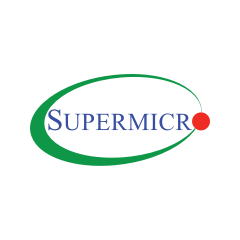

Background: In case you missed it, on 2024-05-01, many of the semiconductor stocks dipped. For comparison, I have also put Google (NASDAQ: GOOGL) on there and it was not affected by the market dynamics. 

- **Unmet Investor Expectations:** Despite strong financial results from Super Micro Computer (SMCI), investors were disappointed as the results fell short of analysts' consensus estimates, triggering a sell-off and negative sentiment across the sector.

- **Supply Chain Issues:** Supermicro's CEO highlighted ongoing supply chain challenges affecting the company's ability to meet demand, which may have raised concerns about similar issues negatively impacting other semiconductor companies.

- **Overvaluation Concerns:** Investors might have reassessed the high valuations, due to AI-boom, of AI-related stocks like Nvidia, Arm Holdings, and Micron Technology, leading to a broader sell-off in the semiconductor sector.

As you can see, Google stock was unaffected by the effects of SMCI performance. The latter had a strong dip on 2024-05, which due to its relevance in semiconductor industry, dipped every stock in there as well. There have been present supply chain issues because the materials which make up a chip have been low in supply recently. 

[Reference #1](https://finance.yahoo.com/news/why-nvidia-arm-holdings-other-204356222.html)

### How and why has Nvidia performed extraordinarily well since 2024?

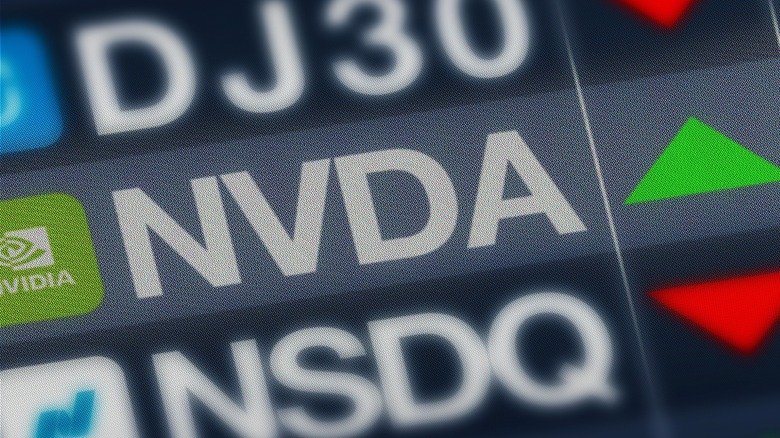

- **Generative AI Demand:** The rapid increase in demand for generative AI technologies, such as those powered by Nvidia's advanced GPUs/CPUs, has significantly driven the company's growth. These chips, such as Rubin or Blackwell, are leading to widespread adoption and high market demand increasing the market price and valuation of the company

- **Impressive Financial Results:** Nvidia has consistently reported exceptional financial results, showcasing substantial year-over-year growth in both revenue and adjusted earnings per share. For instance, fiscal Q1 2025 saw revenue reach 26.04 billion dollars and adjusted EPS at 6.12 dollars, both exceeding market expectations and reinforcing investor confidence to put their money for the shares. 

- **10-for-1 Stock Split:** The announcement of a 10-for-1 stock split made Nvidia's shares boosts investor confidence. People would purchase the shares before the split execution date to have multiplied shares after the split date - benefiting as preferred shareholders. In addition, I strongly believe after the stock split Nvidia will rise if they are persistent with their earnings. 

[Reference #1](https://finance.yahoo.com/news/nvidia-stock-10-wall-street-072434106.html)

[Reference #2](https://finance.yahoo.com/news/nvidia-stock-split-investors-know-141222320.html)

### How did ARM rise after February followed by a steady growth?

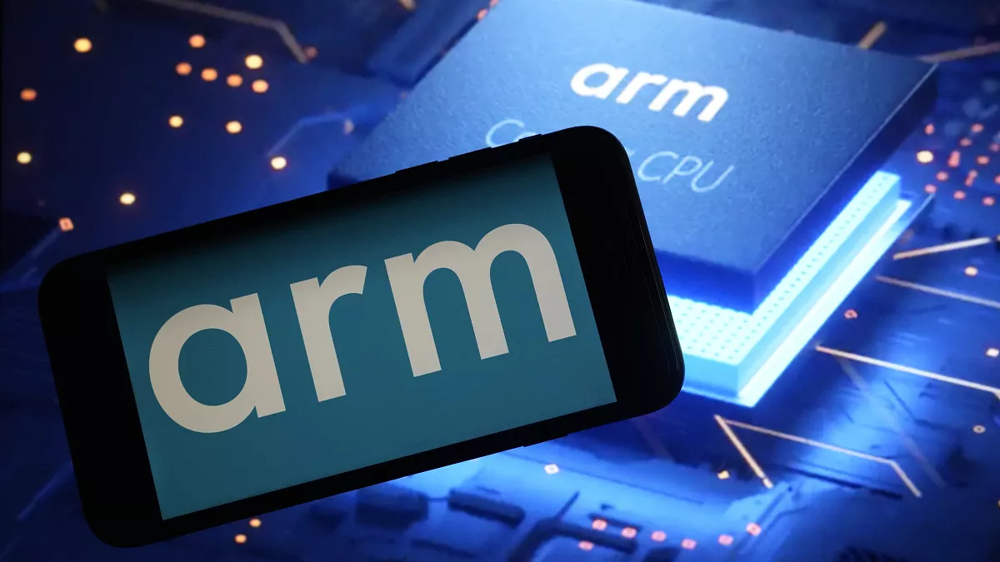

- **Strong Earnings and Forecast:** In February, ARM's stock surged by 48% due to better-than-expected third-quarter earnings and an optimistic profit forecast. The company reported adjusted earnings per share of 29 cents and revenue of 824 million dollars, both exceeding analyst estimates, and projected strong growth for the current quarter. This boosts investor confidence to put their money on ARM, as shown on the graph, in return displays the strong rise. 

- **AI Demand and Major Customers:** The rise was further fueled by ARM's critical role in AI technologies and its significant customer base, including Apple, Google, Microsoft, and Nvidia. The demand for ARM's chip designs, essential for AI applications from cloud to edge devices, boosted investor confidence.

- **Volatility and Market Trends:** In April, ARM's stock dipped partly due to disappointing earnings reports from key partners like ASML and TSMC, which indicated weaknesses in the smartphone market and slower transitions to new technologies. This broader tech market trend negatively impacted ARM's stock. You can see on the April timeline of the graph that ARM decreased, but it has been steadily increasing ever since then. 

- **High Valuation and Investor Sentiment:** The decline also reflected a reassessment of ARM's high valuation amid mixed signals from the tech industry. Despite strong AI momentum, investors questioned whether AI demand alone could sustain ARM's elevated stock price, leading to a pullback.

[Reference #1](https://www.cnbc.com/2024/02/08/arm-shares-soar-after-reporting-strong-earnings-and-forecast.html)

[Reference #2](https://finance.yahoo.com/news/why-arm-holdings-stock-plunged-195752957.html)

[Reference #3](https://finance.yahoo.com/news/why-arm-holdings-stock-soared-184931304.html)

[Reference #4](https://investors.arm.com/financials/quarterly-annual-results)

### Profits (Highest Price - Lowest Price) vs Time graphs
In here, we analyze profits of each company in the Semiconductor Industry. An informed or valuable person from a stock market would buy shares of a stock at the lowest price and sell them at the highest price to earn profit. In other words, the code below is functioned to graph highest price subtracted to lowest price of stock along with their dates ever since ARM's IPO (2023-09-14) to today's date using datetime import. 

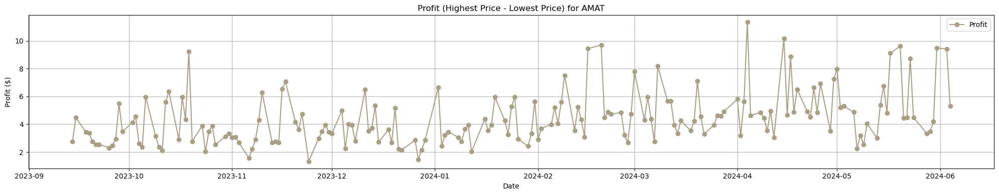

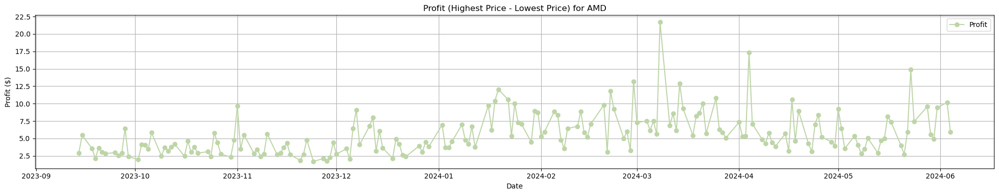

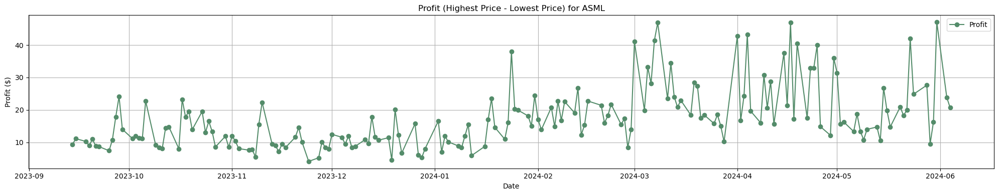

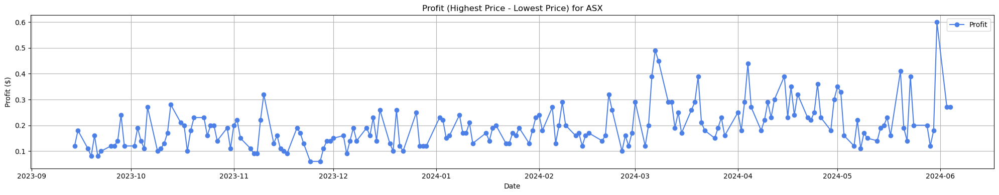

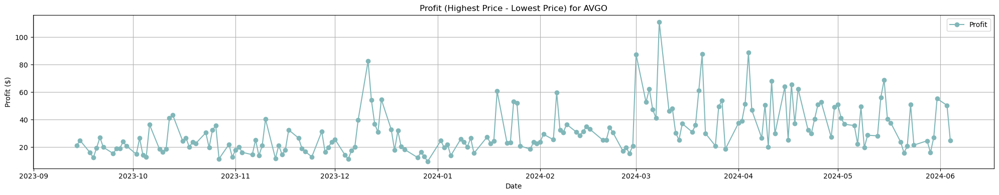

...

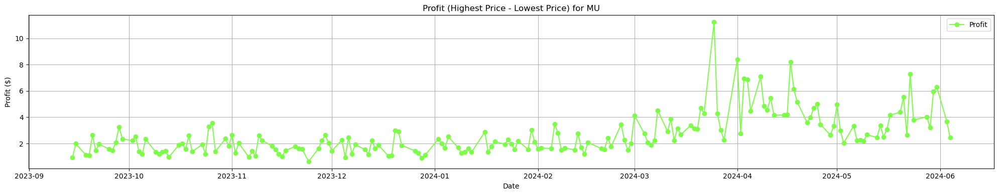

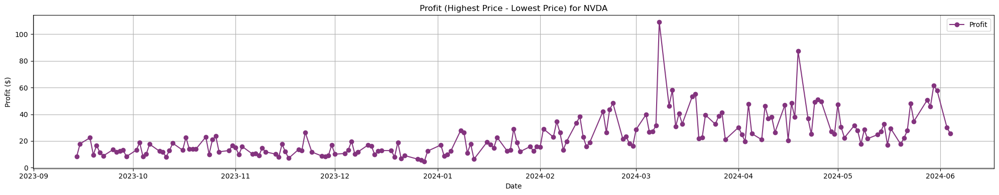

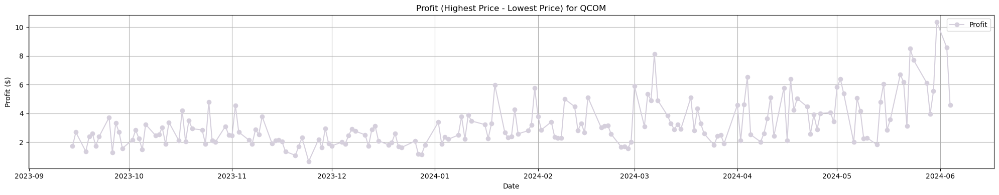

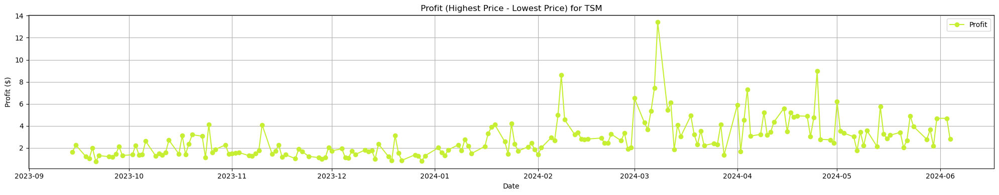

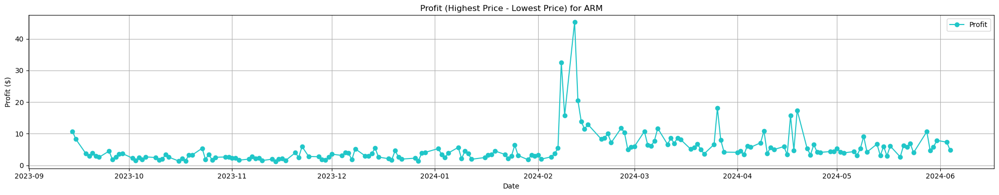

In [4]:
# List of tickers
tickers = ['AMAT', 'AMD', 'ASML', 'ASX', 'AVGO', 'INTC', 'MU', 'NVDA', 'QCOM', 'TSM', 'ARM']

# Define the date range
start_date = "2023-09-14"
end_date = datetime.today().strftime('%Y-%m-%d')

# Fetch historical data (high and low prices) for each ticker and plot
for ticker in tickers:
    # Fetch historical data (high and low prices) from Yahoo Finance
    ticker_data = yf.Ticker(ticker).history(start=start_date, end=end_date)

    # Calculate profit (high - low)
    profit = ticker_data['High'] - ticker_data['Low']

    # Plot the data
    plt.figure(figsize=(20, 4))
    plt.plot(ticker_data.index, profit, label='Profit', color=f'#{random.randint(0, 0xFFFFFF):06x}', marker = 'o')

    # Add labels and title
    plt.title(f'Profit (Highest Price - Lowest Price) for {ticker}')
    plt.xlabel('Date')
    plt.ylabel('Profit ($)')
    plt.legend()

    # Show plot
    plt.grid(True)
    plt.tight_layout()  # Add parentheses to call the function
    plt.show()


### Insights about ARM's lucrative increase in february

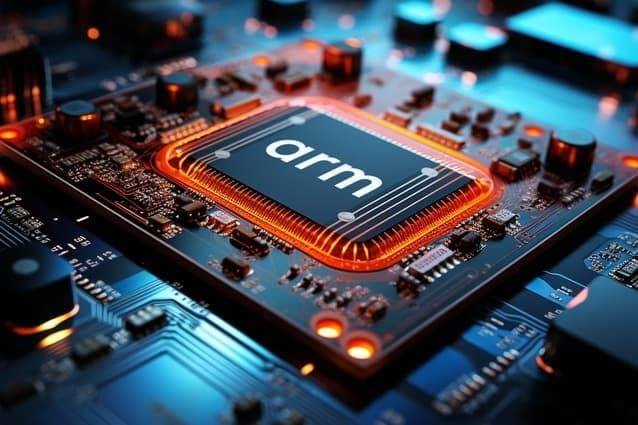

In here, not much could be implied from Profits vs Time graphs. However, there is one similarity between the the profits graph above and the closing price vs time graph. As discussed previously, due to the earnings reports of February, ARM stock has risen at least more than 48%. Obviously, in the closing price graph, there was a huge spike due to investor performance; This is similar to the spikes in the profit graph of ARM above. Let's put this practically, if you have 10 shares of ARM during the profit spike period, you would have earned 45 dollars per share in profit. 

Due to ARM's business model and delays of royalty revenue which can be publicly shown in future, we can expect to see more profit spikes in the future. ARM is definitely a valuable underdog of the semiconductor industry due to its royalty model and its forecasted positive earnings showing potentially more similar February spikes in the future. 

### Financial Metrics Analysis

In here, we analyze the revenues of each company financial information such as revenue, gross profit, operating income, EBIT, EBITDA, Net Income, Total Assets, and Free Cash Flow. Due to performance, we will focus on NVDA and ARM and compare the financials as they have been performing great in the market.

Here are the definitions of each financial information term mentioned:

- **Revenue:** It is the total amount of money generated by a company.
    - **Calculation:** Quantity of Goods or service x Selling price
- **Gross Profit:** It represents the difference between a company's total revenue and the cost of goods sold only.
    - **Calculation:** Gross Profit = Total revenue - Cost of goods sold (COGS)
- **Operating Income:** Profit generated by company after deducting all operating expenses only.
    - **Calculation:** Operating Income = Gross Profit - Operating expenses
- **EBIT:** It stands for 'Earnings before Interest and Taxes'.
    - **Calculation:** EBIT = Operating Income + Interest Expense + Tax Expense
- **EBITDA:** It stands for 'Earnings before Interest taxes, Depreciation, and Amortization.
    - **Calculation:** EBITDA = Operating Income + Depreciation + Amortization
- **Net Income:** It is also known as net profit and is typically the difference between total revenue and total expenses.
    - **Calculation:** Net Income = Total Revenue - Total Expenses
- **Total Assets:** Everything owned by a company and has economic value.
    - **Calculation:** Total Assets = Current assets + Non-current assets
- **Free Cash Flow:** Cash generated by a company's operations after accounting for capital expenditures (CAPEX) and working capital requirements.
    - **Calculation:** Free Cash Flow = Operating Cash Flow - Capital Expenditure

As mentioned earlier, we will focus this on four companies: AMD, Broadcom, Nvidia, and ARM to compare their earnings performance.

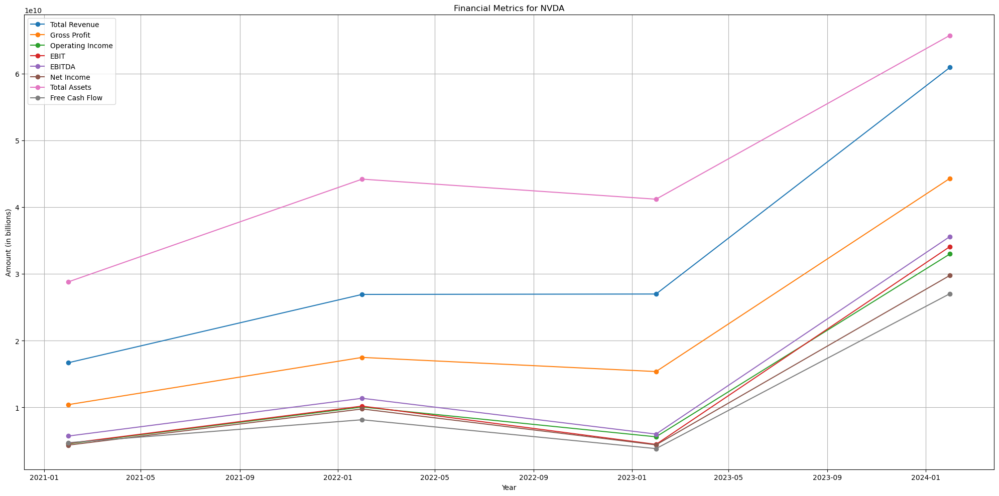

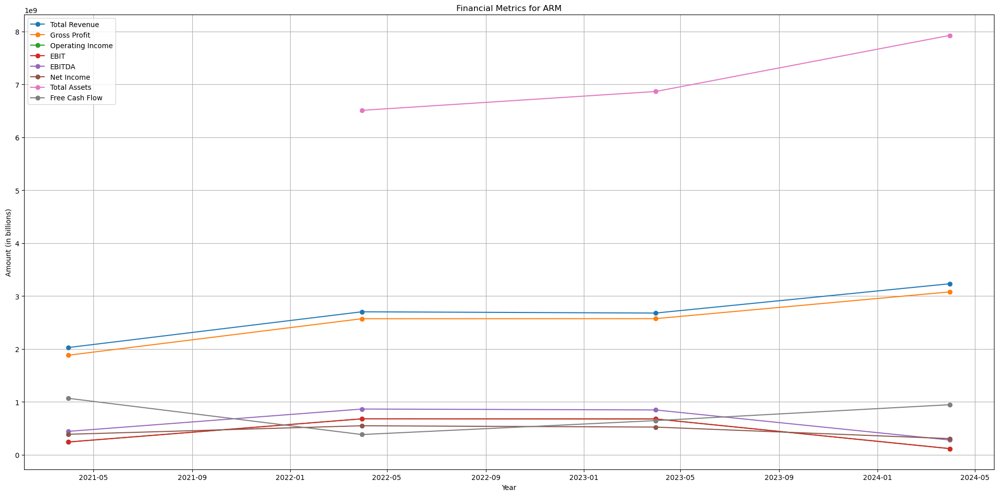

In [4]:
# List of tickers
tickers = ['NVDA','ARM']

# Fetch financial data (revenue) for each ticker and plot
for ticker in tickers:
    # Fetch financial data from Yahoo Finance
    company_ticker = yf.Ticker(ticker)
    financials = company_ticker.financials
    balance_sheet = company_ticker.balance_sheet
    cash_flow = company_ticker.cashflow

    # Extract financial metrics
    revenue = financials.loc['Total Revenue']
    gross_profit = financials.loc['Gross Profit']
    operating_income = financials.loc['Operating Income']
    ebit = financials.loc['EBIT']
    ebitda = financials.loc['EBITDA']
    net_income = financials.loc['Net Income']
    total_assets = balance_sheet.loc['Total Assets']
    free_cash_flow = cash_flow.loc['Free Cash Flow']

    # Plot the data
    plt.figure(figsize=(20, 10))
    plt.plot(revenue.index, revenue.values, label='Total Revenue', marker = 'o')
    plt.plot(gross_profit.index, gross_profit.values, label='Gross Profit', marker = 'o')
    plt.plot(operating_income.index, operating_income.values, label='Operating Income', marker = 'o')
    plt.plot(ebit.index, ebit.values, label='EBIT', marker = 'o')
    plt.plot(ebitda.index, ebitda.values, label='EBITDA', marker = 'o')
    plt.plot(net_income.index, net_income.values, label='Net Income', marker = 'o')
    plt.plot(total_assets.index, total_assets.values, label='Total Assets', marker = 'o')
    plt.plot(free_cash_flow.index, free_cash_flow.values, label='Free Cash Flow', marker = 'o')

    # Add labels and title
    plt.title(f'Financial Metrics for {ticker}')
    plt.xlabel('Year')
    plt.ylabel('Amount (in billions)')
    plt.legend()

    # Show plot
    plt.grid(True)
    plt.tight_layout()
    plt.show()



### NVDA Financial Metrics data

In [4]:
display(yf.Ticker('NVDA').financials)

,2024-01-31,2023-01-31,2022-01-31,2021-01-31
Tax Effect Of Unusual Items,0.0,-284130000.0,0.0,0.0
Tax Rate For Calcs,0.12,0.21,0.019,0.017
Normalized EBITDA,35583000000.0,7340000000.0,11351000000.0,5691000000.0
Total Unusual Items,0.0,-1353000000.0,0.0,0.0
Total Unusual Items Excluding Goodwill,0.0,-1353000000.0,0.0,0.0
Net Income From Continuing Operation Net Minority Interest,29760000000.0,4368000000.0,9752000000.0,4332000000.0
Reconciled Depreciation,1508000000.0,1544000000.0,1174000000.0,1098000000.0
Reconciled Cost Of Revenue,16621000000.0,11618000000.0,9439000000.0,6279000000.0
EBITDA,35583000000.0,5987000000.0,11351000000.0,5691000000.0
EBIT,34075000000.0,4443000000.0,10177000000.0,4593000000.0


### Insights about NVIDIA's Financial Metrics data

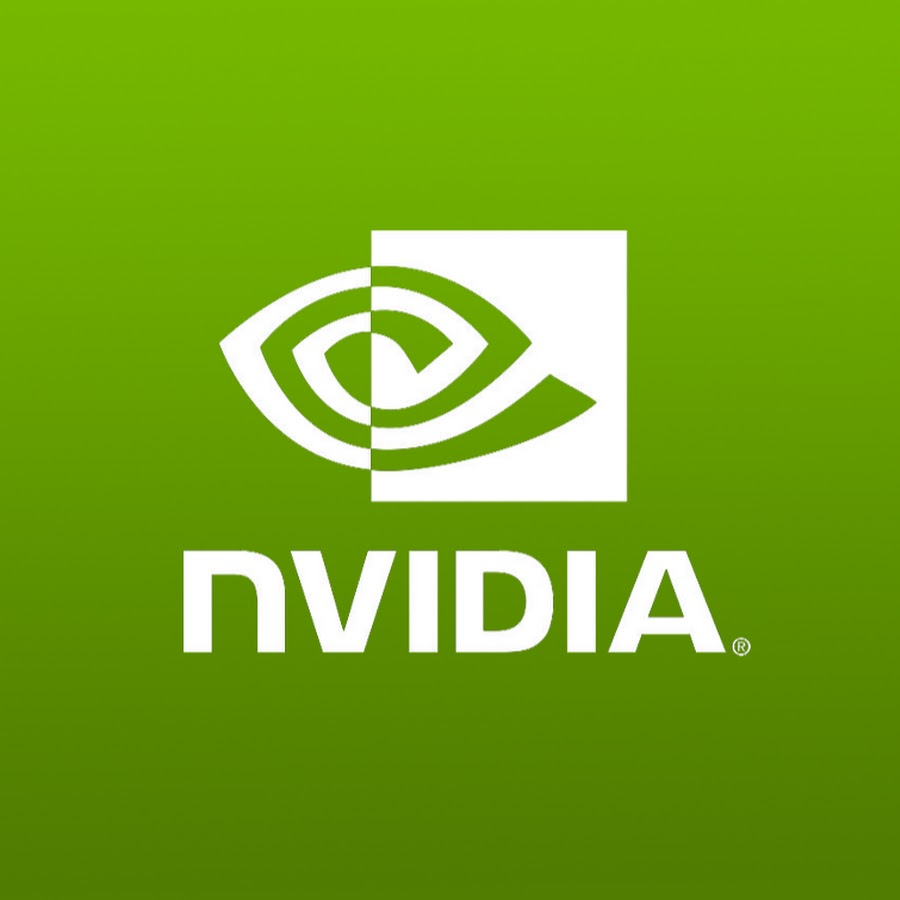

1. **Revenue Growth:** Nvidia's revenue and gross profit have similar pattern according to chart. With respect to ARM's, it looks like the cost of revenue for Nvidia is quite high which explains the spacing between revenue and gross profit. However, after 2023-01, the company's revenue has strongly spiked along with other metrics. Nvidia is a pivotal figure in the AI boom in the semiconductor industry which would make sense why the revenue is high. In addition, there may be a proportional relationship with consumer demand and revenue earnings, the stronger the revenue earnings, the higher the probability for the stock price to go up because of increased consumer demand from their confidence of Nvidia's future prospects. This could be proven as the revenue has went from 16 billion in 2021 to 60.9 billion dollars in 2024, which has in return increased stock prices to 1200 dollars before the 10-for-1 stock split. 

2. **Gross Profit:** In here, gross profit is similar to the pattern of revenue. Due to how large of a market share Nvidia has in the world and in the semiconductor industry, the company may be prone to higher cost of revenue because of their increasing cutting-edge products which involves in making chips. This may be a crucial task as the supply of materials has been rigid recently, due to lower supply, costs would potentially increase. The company's gross profit has went from 10 billion in 2021 to 44 billion dollars in 2024 with a decrease in costs between 2022 and 2023 by roughly 2 billion dollars for some random reason. 

3. **R&D expenditure:** Recently, Nvidia has been the key leader for AI boom as they are intergrating aritificial intelligence in their GPUs for parallel computing. They are in the process of making chips such as Blackwell or Rubin. Due to the latest innovations, the research and development has steadily increased from 3.9 billion dollars in 2021 to a whopping 8.6 billion dollars in 2024 along with other relevant costs to the production of these fascinating chips. 

4. **Operating income:** Nvidia has shown an interesting pattern with its operating income. The company has well-managed gross profit, and subtracting it with operating expense would give you the resulting operating income. Nvidia's operating income has went from 4.5 billion in 2021 to 10 billion dollars in 2022 followed by a drop in 2023 where it was 5.5 billion to a 32 billion dollars in 2024. The drop in 2023 could be indicated by either a drop in revenue or by an increase in operating expenses. Gross Profit, as dicussed earlier, did decrease in 2023 to 15.3 billion dollars from 2022. The operating expesnes has steadily increased over the 4 year span, so it could be directed to decrease in slight gross profit in 2023. 



### ARM Financial Metrics data

In [7]:
display(yf.Ticker('ARM').financials)

,2024-03-31,2023-03-31,2022-03-31,2021-03-31
Tax Effect Of Unusual Items,-2400000.0,-1533532.041729,-6580000.0,-660000.0
Tax Rate For Calcs,0.4,0.219076,0.14,0.22
Normalized EBITDA,285000000.0,855000000.0,912000000.0,446000000.0
Total Unusual Items,-6000000.0,-7000000.0,-47000000.0,-3000000.0
Total Unusual Items Excluding Goodwill,-6000000.0,-7000000.0,-47000000.0,-3000000.0
Net Income From Continuing Operation Net Minority Interest,306000000.0,524000000.0,676000000.0,544000000.0
Reconciled Depreciation,162000000.0,170000000.0,185000000.0,201000000.0
Reconciled Cost Of Revenue,154000000.0,106000000.0,131000000.0,145000000.0
EBITDA,279000000.0,848000000.0,865000000.0,443000000.0
EBIT,117000000.0,678000000.0,680000000.0,242000000.0


### Insights about ARM's financial metrics

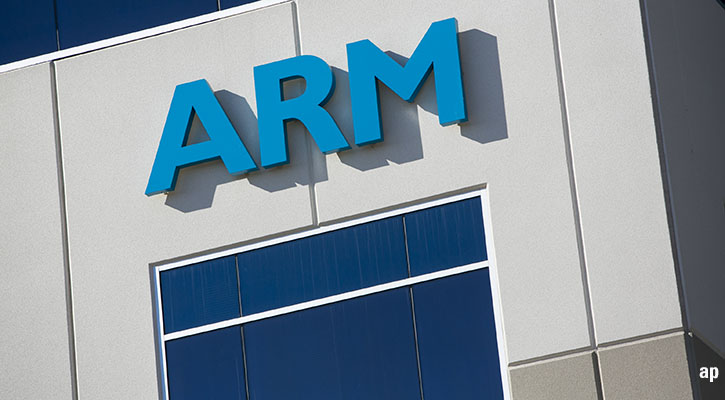

1. **Revenue Growth:** ARM's revenue and gross profit have been similarly and steadily increasing ever since the start of the company. ARM's IPO took place on September of 2023. According to the metrics graph, ever since its IPO, ARM has shown greater revenue which may have been a indicator for its increasing stock prices. Greater revenue earnings, especially in technology stocks, give investors confidence to keep buying shares of the company, which shows how higher earnings and consumer demand could be proportionally related to each other. Revenue earnings have went from 2.027 billion to 3.23 billion dollars in recent earnings reports, showing strong future prospects of the company. 

2. **Gross Profit:** Gross Profit has been increasing similarly like revenue. It is computed by the difference between revenue and cost of revenue, but again, the growth is steady just like revenue indicating that the company is potentially pivoted to cost-saving measures. Just like revenue, but not strongly, gross profit could be related to higher investor confidence boosting the price of the stock. ARM's gross profit has increased from 1.882 billion to 3.07 billion dollars in its recent reports, which is a strong growth in the graph. 

3. **R&D Expenditure:** Research and Development (R&D) expenses have significantly increased, from 814 million in 2021 to 1.979 billion dollars in 2024. This suggests a substantial investment in innovation and development, which could be a positive indicator of future growth prospects. This can be directly related to the recent AI boom in semiconductor stocks. As ARM's business model is like royalty, it designs chips and licenses them for companies like Nvidia or Apple, the former being a key figure in AI chips would surely be supported by ARM's R&D budget to keep up with AI race to help other companies. 

4. **Operating Income:** The Operating Income of ARM is interesting. It has went from 242 million in 2021 to 680 million in 2022 to 117 million dollars in 2024. These changes in operating income may have been due to the rising costs of R&D expenditure.


# Investment decision for ARM stock

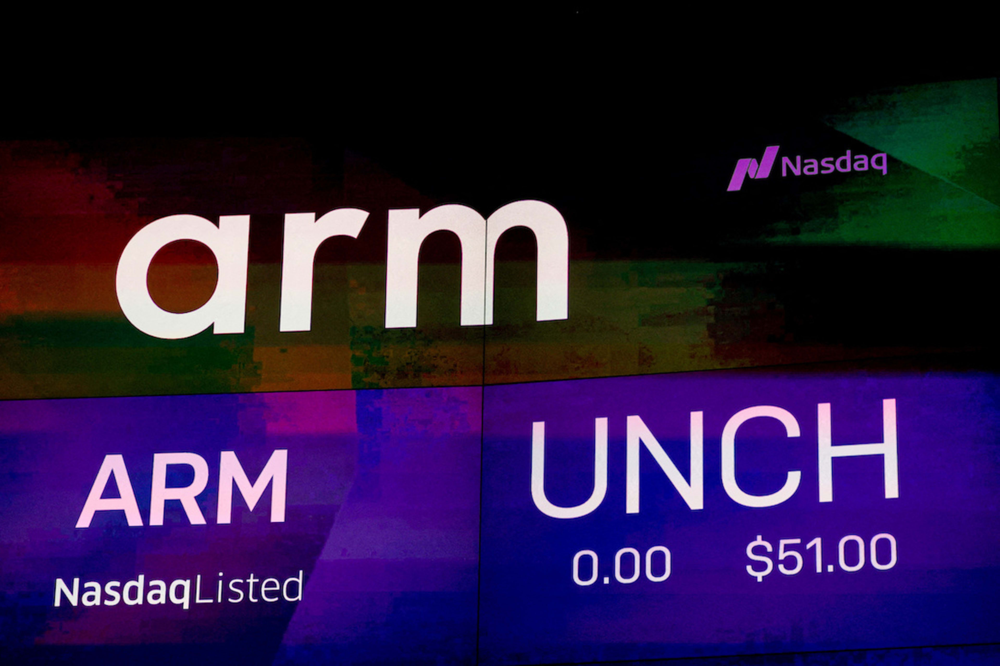

Note: I am not responsible for any of your financial losses, if any, from the stock market. This is merely a project designed to overview the semiconductor industry and ARM's performance ever since the company's IPO. 

BUY!

ARM is an underdog of the semiconductor industry. It has shown steady increase in its stock price ever since its IPO due to many price spikes because of strong revenue earnings underscoring investor confidence. The price is hovering around the 130s and it is best to buy it as soon as possible before it erupts to 200 dollars or even higher. ARM designs and licenses chips for companies like Nvidia, a pivotal figure in the AI-boom, highlighting its underdog performance in the industry. Its stock performance, many times, has moved similarly from the positive trends in other stocks like Nvidia (NASDAQ: NVDA) and Broadcom (NASDAQ: TSM). Its price gives consumers an affordable opportunity to participate in the latest AI market. 

### Conclusion
Thank you for your time for viewing my project! You are more than welcome to analyze any of the data I have presented using Yfinance. Feel free to share with me what research you came up with! 

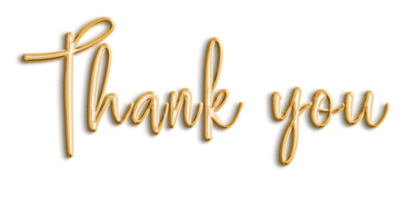